## Data preprocessing

### Raw data

* Raw data are stored in txt files but the issue is txt files start with meta data and can not be imported directly. 
* I need to remove first few lines and save data in a new place.

+-------------+ Condor Instruments Report +-------------+   
SOFTWARE_VERSION : 1.0.16   
DEVICE_ID : 2826   
DEVICE_MODEL : ActTrust1   
HARDWARE_VERSION : 3.5   
FIRMWARE_VERSION : 3.8   
MEMORY_SIZE : 7987712   
LOG_SIZE : 1696381   
MEMORY_USAGE : 21.24 %   
BATTERY_VOLTAGE : 4.17969   
ERROR_FLAG : 0   
ERROR_CODE : 0   
POWER_DOWN_FLAG : 0   
TAT_THRESHOLD : 1024   
ORIENTATION : 0   
MODE : PIM/TAT/ZCM   
INTERVAL : 60   
DATA_CORRECTION : 1   
DATA_CORRECTION_DESCRIPTION : Lacuna tratada nos dados.   
DATE_TIME : 19/10/2020 12:43:59   
+-------------------------------------------------------+   

* I created a new folder "data_acti_raw_1" and I transfered a copy of raw data
* In total, there are 10 files which define information from 10 person.



### Proportional Integration Mode (PIM)

**Proportional Integration Mode (PIM)** is a method used in radiation detection where the signal produced by a detector is integrated over time to measure the total charge collected. This mode is particularly useful for measuring radiation dose because it accounts for the total energy deposited in the detector. Here’s how it works:

1. **Signal Detection**: When radiation interacts with the detector, it produces ionization events that generate a current pulse.
2. **Integration**: The current pulse is integrated over time to measure the total charge.
3. **Proportional Response**: The total charge collected is proportional to the energy deposited by the radiation. Thus, the measured signal is proportional to the radiation dose.

PIM is advantageous in scenarios where accurate dose measurements are needed, as it provides a direct correlation between the detected signal and the radiation energy.

### Time Above Threshold (TAT)

**Time Above Threshold (TAT)** is a method used in radiation detection to measure the duration for which the detector signal remains above a predefined threshold level. This mode focuses on the temporal aspect of the signal rather than its amplitude. Here’s a breakdown:

1. **Threshold Setting**: A threshold level is set based on the expected signal amplitude.
2. **Time Measurement**: The time period during which the signal remains above this threshold is measured.
3. **Correlation to Radiation**: The time above threshold can be correlated with the intensity or rate of radiation, depending on the specific application.

TAT is useful in applications where the rate of events or pulse duration provides meaningful information about the radiation environment, such as in pulse counting or event rate monitoring.

### Zero Crossings Mode (ZCM)

**Zero Crossings Mode (ZCM)** is a method that measures the frequency of zero crossings in an alternating current (AC) signal generated by the detector. Here’s how it works:

1. **Signal Generation**: Radiation interactions with the detector produce an AC signal.
2. **Zero Crossings Counting**: The number of times the signal crosses the zero voltage level is counted.
3. **Frequency Measurement**: The frequency of zero crossings is related to the radiation intensity or rate.

ZCM is particularly useful in scenarios where the frequency of interactions (rather than their amplitude or duration) provides the necessary information, such as in certain types of neutron detectors or fast-pulse applications.

### Summary

- **Proportional Integration Mode (PIM)**: Measures total charge collected, providing a signal proportional to the radiation dose.
- **Time Above Threshold (TAT)**: Measures the time duration for which the signal is above a set threshold, useful for event rate monitoring.
- **Zero Crossings Mode (ZCM)**: Counts the frequency of zero voltage crossings in an AC signal, indicating the rate of interactions.

In [1]:
# preprocecesing function for the raw data
import pandas as pd

def preprocess_data(data):
    # read the data from the txt file
    data = pd.read_csv(data, sep=';', header=0)
    # identify the rows with missing values
    missing_values = data.isnull().sum()
    print(missing_values)
    # shape of the data
    print(data.shape)
    return data

# directory of the raw data
path = '/Users/arahjou/Downloads/offwrist-detection/data_acti_raw_1/NA01.txt'

df= preprocess_data(path)

DATE/TIME          0
MS                 0
EVENT              0
TEMPERATURE        0
EXT TEMPERATURE    0
ORIENTATION        0
PIM                0
PIMn               0
TAT                0
TATn               0
ZCM                0
ZCMn               0
LIGHT              0
AMB LIGHT          0
RED LIGHT          0
GREEN LIGHT        0
BLUE LIGHT         0
IR LIGHT           0
UVA LIGHT          0
UVB LIGHT          0
STATE              0
dtype: int64
(45990, 21)


In [2]:
df.describe()

,MS,EVENT,TEMPERATURE,EXT TEMPERATURE,ORIENTATION,PIM,PIMn,TAT,TATn,ZCM,ZCMn,LIGHT,AMB LIGHT,RED LIGHT,GREEN LIGHT,BLUE LIGHT,IR LIGHT,UVA LIGHT,UVB LIGHT,STATE
count,45990.0,45990.000000,45990.000000,45990.000000,45990.0,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.0,45990.0,45990.000000
mean,0.0,0.001522,27.771032,26.945930,0.0,1236.315830,20.596936,77.467580,1.290656,36.099369,0.601362,457.109660,185.229234,124.537745,150.229455,196.807503,164.431046,0.0,0.0,0.652446
std,0.0,0.043217,5.502263,5.321249,0.0,2683.274604,44.708391,149.569031,2.492107,91.078163,1.517464,2620.749536,1061.979434,888.574761,979.973176,1455.341840,1029.143963,0.0,0.0,0.589114
min,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000
25%,0.0,0.000000,23.090000,22.750000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.010000,0.000000,0.000000,0.010000,0.010000,0.0,0.0,0.000000
50%,0.0,0.000000,29.270000,28.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.810000,0.330000,0.510000,0.430000,0.310000,0.0,0.0,1.000000
75%,0.0,0.000000,31.990000,30.560000,0.0,1289.000000,21.479150,91.000000,1.516670,27.000000,0.450000,26.620000,10.790000,3.960000,6.340000,5.420000,6.017500,0.0,0.0,1.000000
max,0.0,3.000000,57.530000,58.750000,0.0,67952.000000,1132.530000,1236.000000,20.600000,1285.000000,21.416700,23486.670000,9517.260000,9517.260000,9517.260000,19034.330000,9517.260000,0.0,0.0,4.000000


In [3]:
df.head()

,DATE/TIME,MS,EVENT,TEMPERATURE,EXT TEMPERATURE,ORIENTATION,PIM,PIMn,TAT,TATn,...,ZCMn,LIGHT,AMB LIGHT,RED LIGHT,GREEN LIGHT,BLUE LIGHT,IR LIGHT,UVA LIGHT,UVB LIGHT,STATE
0,17/09/2020 13:35:36,0,0,26.07,22.94,0,12156,0.000008,661,4.130350e-07,...,2.836880e-07,30.28,12.27,6.62,8.88,12.33,12.11,0.0,0.0,0
1,17/09/2020 13:36:36,0,0,27.09,24.31,0,8954,149.233000,572,9.533330e+00,...,4.766670e+00,3192.39,1293.62,1025.19,1136.83,1636.06,1217.84,0.0,0.0,0
2,17/09/2020 13:37:36,0,0,27.80,26.12,0,7814,130.233000,390,6.500000e+00,...,4.716670e+00,11159.58,4522.08,2538.92,3251.04,3873.62,3693.30,0.0,0.0,0
3,17/09/2020 13:38:36,0,0,28.33,27.06,0,8897,148.283000,576,9.600000e+00,...,3.883330e+00,14.50,5.88,2.45,3.75,3.94,7.17,0.0,0.0,0
4,17/09/2020 13:39:36,0,0,25.10,26.88,0,8097,134.950000,685,1.141670e+01,...,4.033330e+00,7.17,2.90,1.25,1.67,1.69,3.30,0.0,0.0,0


In [4]:
# Make headers python friendly
df.columns = df.columns.str.replace(' ', '_')

# convert df['DATE/TIME'] to datetime
df['DATE/TIME'] = pd.to_datetime(df['DATE/TIME'])

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/1888430548.py:5: UserWarning: Parsing dates in %d/%m/%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['DATE/TIME'] = pd.to_datetime(df['DATE/TIME'])


In [5]:
# Convert the 'DATE/TIME' column to month, day, and hour columns
#df['month'] = df['DATE/TIME'].dt.month
df['day'] = df['DATE/TIME'].dt.day
df['hour'] = df['DATE/TIME'].dt.hour

In [6]:
# drop the 'DATE/TIME' column
#df = df.drop(['DATE/TIME'], axis=1)
# drop 'MS' column
df = df.drop(['MS'], axis=1)
# drop 'UVA_LIGHT' column
df = df.drop(['UVA_LIGHT'], axis=1)
# drop 'UVB_LIGHT' column
df = df.drop(['UVB_LIGHT'], axis=1)
# drop 'Orentation' column
df = df.drop(['ORIENTATION'], axis=1)

In [7]:
# identifing data types
df.dtypes

DATE/TIME          datetime64[ns]
EVENT                       int64
TEMPERATURE               float64
EXT_TEMPERATURE           float64
PIM                         int64
PIMn                      float64
TAT                         int64
TATn                      float64
ZCM                         int64
ZCMn                      float64
LIGHT                     float64
AMB_LIGHT                 float64
RED_LIGHT                 float64
GREEN_LIGHT               float64
BLUE_LIGHT                float64
IR_LIGHT                  float64
STATE                       int64
day                         int32
hour                        int32
dtype: object

In [8]:
df.describe()

,DATE/TIME,EVENT,TEMPERATURE,EXT_TEMPERATURE,PIM,PIMn,TAT,TATn,ZCM,ZCMn,LIGHT,AMB_LIGHT,RED_LIGHT,GREEN_LIGHT,BLUE_LIGHT,IR_LIGHT,STATE,day,hour
count,45990,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000,45990.000000
mean,2020-10-03 12:51:01.003109376,0.001522,27.771032,26.945930,1236.315830,20.596936,77.467580,1.290656,36.099369,0.601362,457.109660,185.229234,124.537745,150.229455,196.807503,164.431046,0.652446,15.653947,11.498195
min,2020-09-17 13:35:36,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,2020-09-25 13:13:43,0.000000,23.090000,22.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.010000,0.000000,0.000000,0.010000,0.010000,0.000000,8.000000,5.000000
50%,2020-10-03 12:50:58,0.000000,29.270000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.810000,0.330000,0.510000,0.430000,0.310000,1.000000,16.000000,11.000000
75%,2020-10-11 12:28:13,0.000000,31.990000,30.560000,1289.000000,21.479150,91.000000,1.516670,27.000000,0.450000,26.620000,10.790000,3.960000,6.340000,5.420000,6.017500,1.000000,23.000000,18.000000
max,2020-10-19 12:06:01,3.000000,57.530000,58.750000,67952.000000,1132.530000,1236.000000,20.600000,1285.000000,21.416700,23486.670000,9517.260000,9517.260000,9517.260000,19034.330000,9517.260000,4.000000,30.000000,23.000000
std,NaN,0.043217,5.502263,5.321249,2683.274604,44.708391,149.569031,2.492107,91.078163,1.517464,2620.749536,1061.979434,888.574761,979.973176,1455.341840,1029.143963,0.589114,8.412462,6.928874


<Axes: >

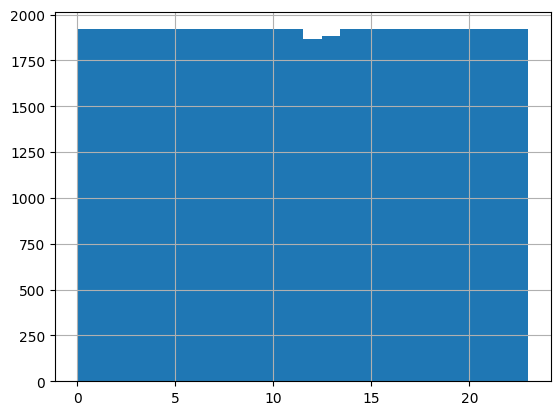

In [9]:
# histogram of the df['month'] column
df['hour'].hist(bins=24)

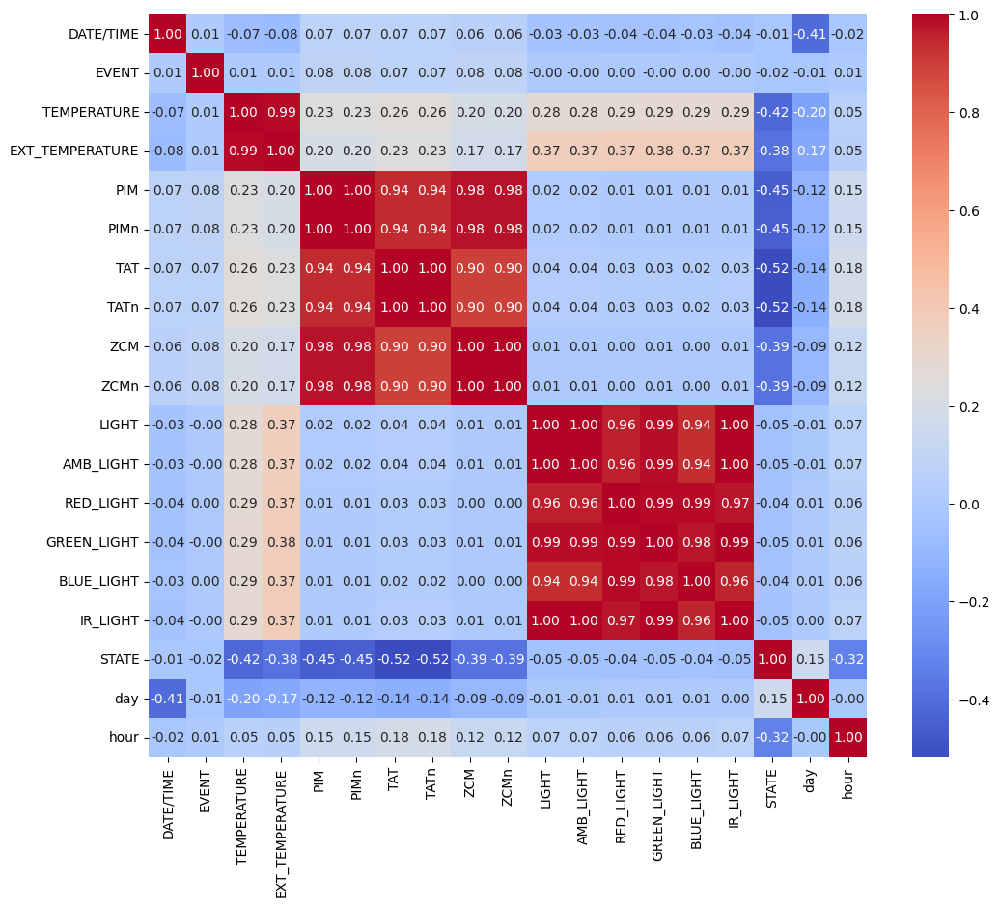

In [10]:
# calculate correlation matrix
corr = df.corr()
#corr.style.background_gradient(cmap='coolwarm')

# heatmap using seaborn with correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()


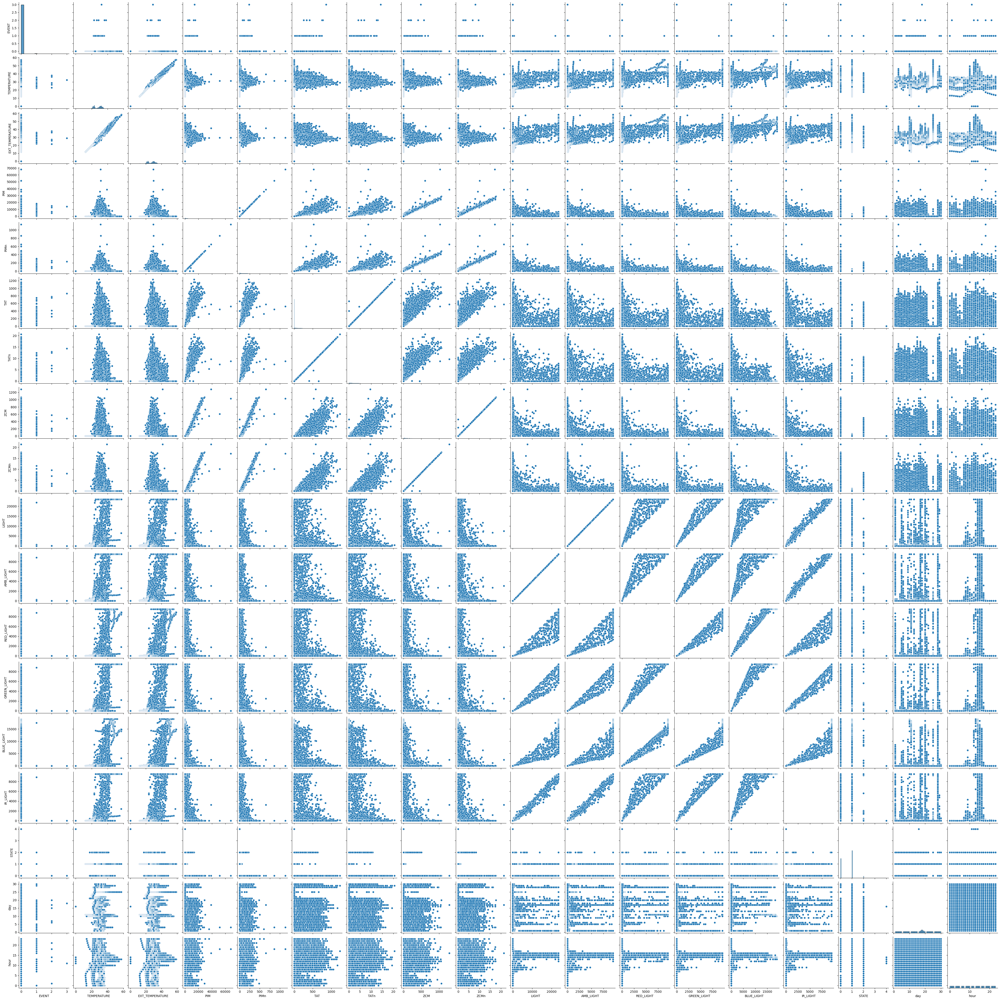

In [11]:
# draw pairplot using seaborn
sns.pairplot(df)
plt.show()

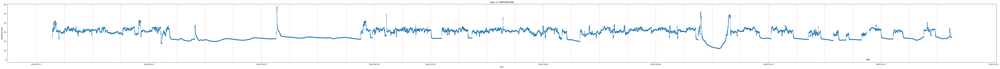

In [12]:
# Extract unique days
unique_days = df['DATE/TIME'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(df['DATE/TIME'], df['TEMPERATURE'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('TEMPERATURE')
plt.title('hour vs TEMPERATURE')
plt.show()

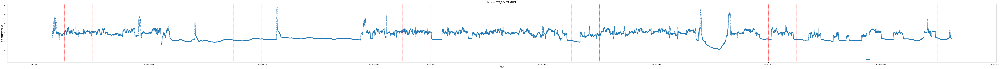

In [13]:
# Extract unique days
unique_days = df['DATE/TIME'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(df['DATE/TIME'], df['EXT_TEMPERATURE'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('EXT_TEMPERATURE')
plt.title('hour vs EXT_TEMPERATURE')
plt.show()

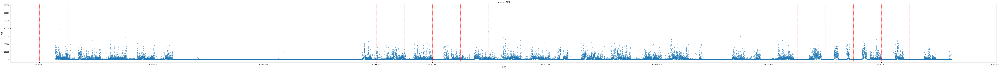

In [14]:
# Extract unique days
unique_days = df['DATE/TIME'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(df['DATE/TIME'], df['PIM'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('PIM')
plt.title('hour vs PIM')
plt.show()

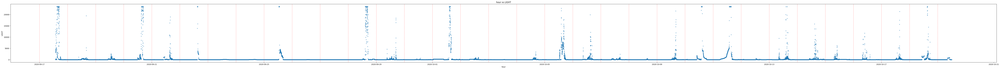

In [15]:
# Extract unique days
unique_days = df['DATE/TIME'].dt.floor('d').unique()

plt.figure(figsize=(100, 6))
plt.scatter(df['DATE/TIME'], df['LIGHT'], s=10, alpha=0.5)

# Add vertical dashed lines for each unique day
for day in unique_days:
    plt.axvline(day, color='r', linestyle='--', linewidth=0.5)

plt.xlabel('hour')
plt.ylabel('LIGHT')
plt.title('hour vs LIGHT')
plt.show()

### Plot per day

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/1628194285.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()


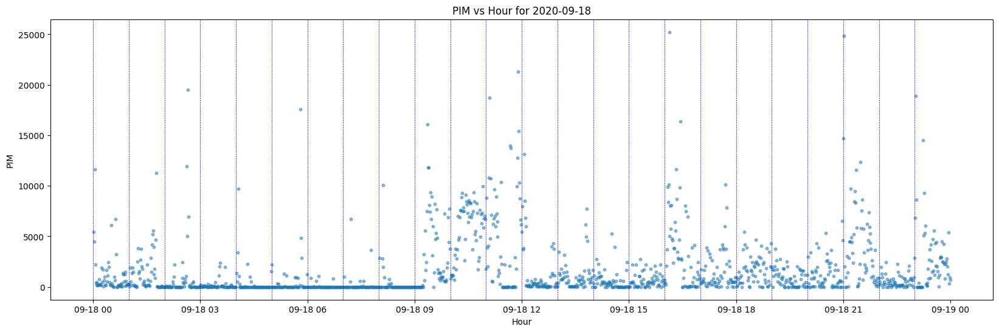

In [16]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()

    plt.figure(figsize=(20, 6))
    plt.scatter(day_data['DATE/TIME'], day_data['PIM'], s=10, alpha=0.5)

    # Add vertical dashed lines for each unique hour
    for hour in unique_hours:
        plt.axvline(hour, color='b', linestyle='--', linewidth=0.5)

    plt.xlabel('Hour')
    plt.ylabel('PIM')
    plt.title(f'PIM vs Hour for {day}')
    plt.show()

# Example usage
plot_day(df, '2020-09-18')

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/4136198031.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()


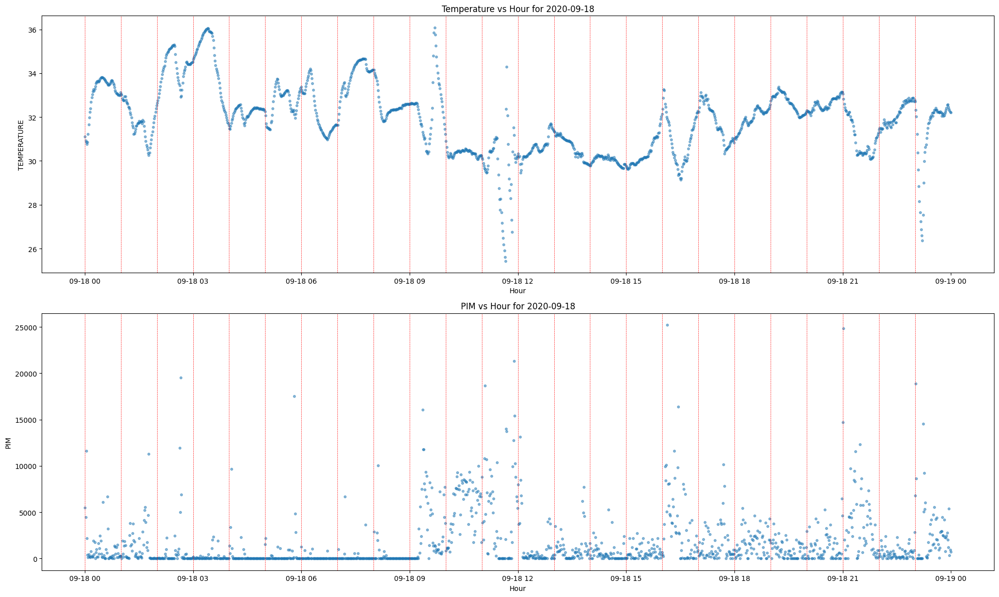

In [17]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()

    fig, axs = plt.subplots(2, 1, figsize=(20, 12))

    # Plot TEMPERATURE
    axs[0].scatter(day_data['DATE/TIME'], day_data['TEMPERATURE'], s=10, alpha=0.5)
    axs[0].set_xlabel('Hour')
    axs[0].set_ylabel('TEMPERATURE')
    axs[0].set_title(f'Temperature vs Hour for {day}')
    for hour in unique_hours:
        axs[0].axvline(hour, color='r', linestyle='--', linewidth=0.5)

    # Plot PIM
    axs[1].scatter(day_data['DATE/TIME'], day_data['PIM'], s=10, alpha=0.5)
    axs[1].set_xlabel('Hour')
    axs[1].set_ylabel('PIM')
    axs[1].set_title(f'PIM vs Hour for {day}')
    for hour in unique_hours:
        axs[1].axvline(hour, color='r', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

# Example usage
plot_day(df, '2020-09-18')


/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/1427322978.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()


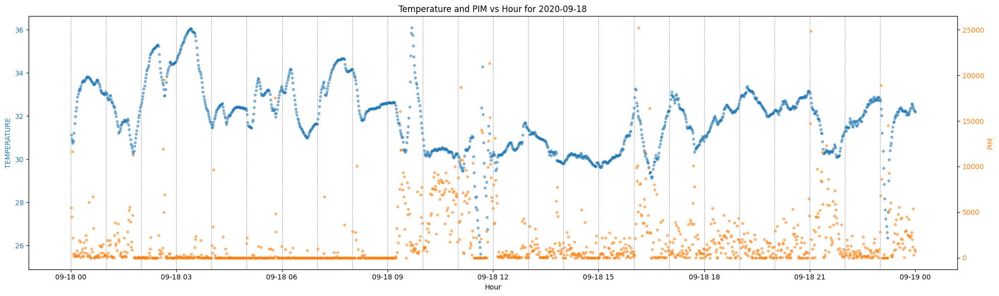

In [18]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color)
    ax1.scatter(day_data['DATE/TIME'], day_data['TEMPERATURE'], s=10, alpha=0.5, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_title(f'Temperature and PIM vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:orange'
    ax2.set_ylabel('PIM', color=color)  # we already handled the x-label with ax1
    ax2.scatter(day_data['DATE/TIME'], day_data['PIM'], s=10, alpha=0.5, color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(df, '2020-09-18')


## Overlaying three variables

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/844623904.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()


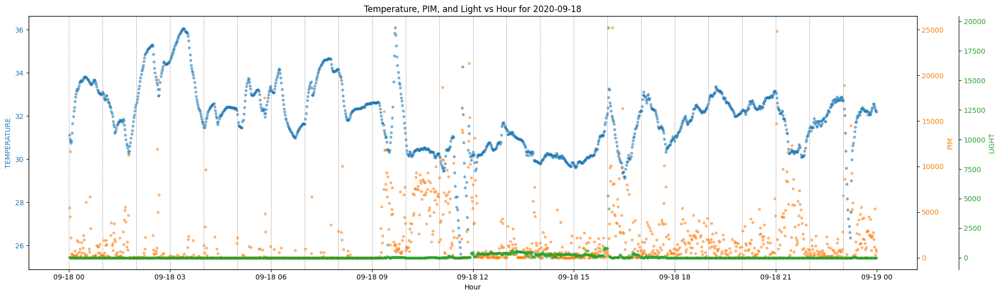

In [19]:
def plot_day(df, day):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color1)
    ax1.scatter(day_data['DATE/TIME'], day_data['TEMPERATURE'], s=10, alpha=0.5, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.set_title(f'Temperature, PIM, and Light vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color2 = 'tab:orange'
    ax2.set_ylabel('PIM', color=color2)
    ax2.scatter(day_data['DATE/TIME'], day_data['PIM'], s=10, alpha=0.5, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create a third y-axis for LIGHT
    ax3 = ax1.twinx()  # instantiate another axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))  # move the spine outward by 60 points
    color3 = 'tab:green'
    ax3.set_ylabel('LIGHT', color=color3)
    ax3.scatter(day_data['DATE/TIME'], day_data['LIGHT'], s=10, alpha=0.5, color=color3)
    ax3.tick_params(axis='y', labelcolor=color3)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(df, '2020-09-18')


## Scaled version

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/795058746.py:8: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()
/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/795058746.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_min) / (temp_max - temp_min)
/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/795058746.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

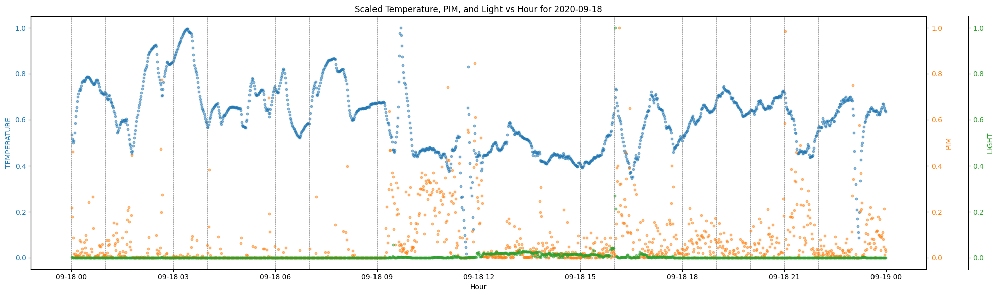

In [20]:

def plot_day(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Extract unique hours
    unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['TEMPERATURE'].max(), day_data['TEMPERATURE'].min()
        pim_max, pim_min = day_data['PIM'].max(), day_data['PIM'].min()
        light_max, light_min = day_data['LIGHT'].max(), day_data['LIGHT'].min()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_min) / (temp_max - temp_min)
        day_data['PIM'] = (day_data['PIM'] - pim_min) / (pim_max - pim_min)
        day_data['LIGHT'] = (day_data['LIGHT'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['TEMPERATURE'].mean(), day_data['TEMPERATURE'].std()
        pim_mean, pim_std = day_data['PIM'].mean(), day_data['PIM'].std()
        light_mean, light_std = day_data['LIGHT'].mean(), day_data['LIGHT'].std()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_mean) / temp_std
        day_data['PIM'] = (day_data['PIM'] - pim_mean) / pim_std
        day_data['LIGHT'] = (day_data['LIGHT'] - light_mean) / light_std

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color1)
    ax1.scatter(day_data['DATE/TIME'], day_data['TEMPERATURE'], s=10, alpha=0.5, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.set_title(f'Scaled Temperature, PIM, and Light vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color2 = 'tab:orange'
    ax2.set_ylabel('PIM', color=color2)
    ax2.scatter(day_data['DATE/TIME'], day_data['PIM'], s=10, alpha=0.5, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create a third y-axis for LIGHT
    ax3 = ax1.twinx()  # instantiate another axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))  # move the spine outward by 60 points
    color3 = 'tab:green'
    ax3.set_ylabel('LIGHT', color=color3)
    ax3.scatter(day_data['DATE/TIME'], day_data['LIGHT'], s=10, alpha=0.5, color=color3)
    ax3.tick_params(axis='y', labelcolor=color3)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(df, '2020-09-18')


## Removing outlayer and scaling

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/3698712477.py:21: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()


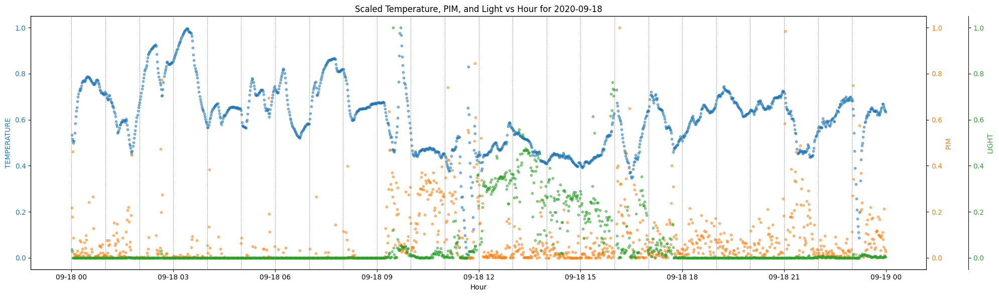

In [21]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_day(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Remove outliers
    day_data = remove_outliers(day_data, 'TEMPERATURE')
    day_data = remove_outliers(day_data, 'PIM')
    day_data = remove_outliers(day_data, 'LIGHT')

    # Extract unique hours
    unique_hours = day_data['DATE/TIME'].dt.floor('H').unique()

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['TEMPERATURE'].max(), day_data['TEMPERATURE'].min()
        pim_max, pim_min = day_data['PIM'].max(), day_data['PIM'].min()
        light_max, light_min = day_data['LIGHT'].max(), day_data['LIGHT'].min()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_min) / (temp_max - temp_min)
        day_data['PIM'] = (day_data['PIM'] - pim_min) / (pim_max - pim_min)
        day_data['LIGHT'] = (day_data['LIGHT'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['TEMPERATURE'].mean(), day_data['TEMPERATURE'].std()
        pim_mean, pim_std = day_data['PIM'].mean(), day_data['PIM'].std()
        light_mean, light_std = day_data['LIGHT'].mean(), day_data['LIGHT'].std()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_mean) / temp_std
        day_data['PIM'] = (day_data['PIM'] - pim_mean) / pim_std
        day_data['LIGHT'] = (day_data['LIGHT'] - light_mean) / light_std

    fig, ax1 = plt.subplots(figsize=(20, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('TEMPERATURE', color=color1)
    ax1.scatter(day_data['DATE/TIME'], day_data['TEMPERATURE'], s=10, alpha=0.5, color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.set_title(f'Scaled Temperature, PIM, and Light vs Hour for {day}')
    for hour in unique_hours:
        ax1.axvline(hour, color='gray', linestyle='--', linewidth=0.5)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color2 = 'tab:orange'
    ax2.set_ylabel('PIM', color=color2)
    ax2.scatter(day_data['DATE/TIME'], day_data['PIM'], s=10, alpha=0.5, color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create a third y-axis for LIGHT
    ax3 = ax1.twinx()  # instantiate another axes that shares the same x-axis
    ax3.spines['right'].set_position(('outward', 60))  # move the spine outward by 60 points
    color3 = 'tab:green'
    ax3.set_ylabel('LIGHT', color=color3)
    ax3.scatter(day_data['DATE/TIME'], day_data['LIGHT'], s=10, alpha=0.5, color=color3)
    ax3.tick_params(axis='y', labelcolor=color3)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# Example usage
plot_day(df, '2020-09-18')


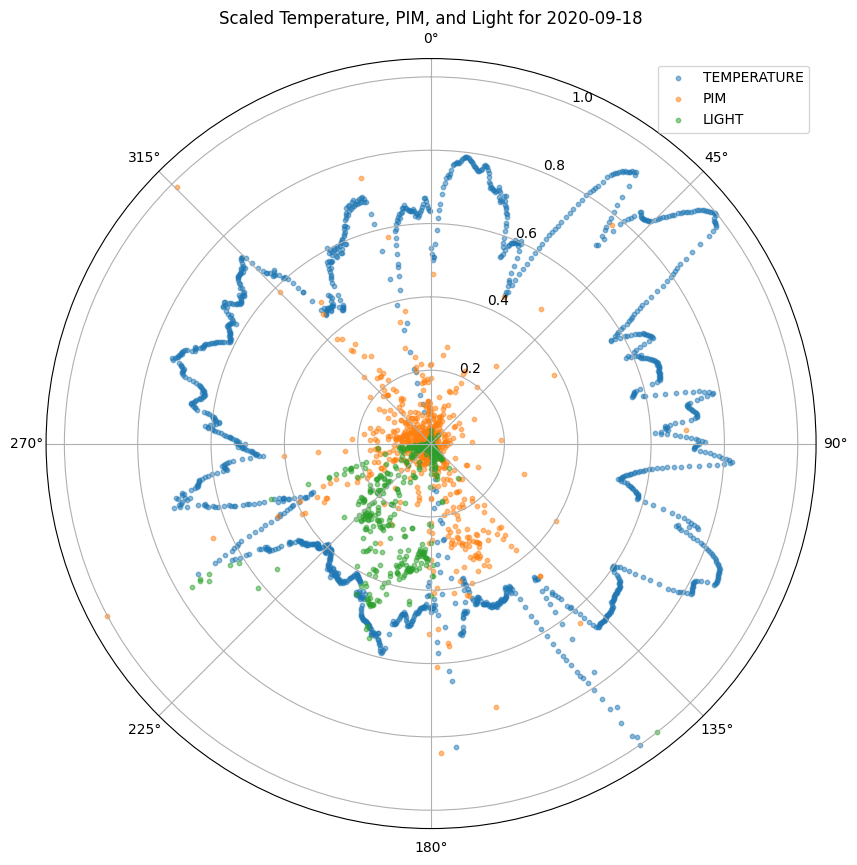

In [22]:
#Polar plot

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_day_polar(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Remove outliers
    day_data = remove_outliers(day_data, 'TEMPERATURE')
    day_data = remove_outliers(day_data, 'PIM')
    day_data = remove_outliers(day_data, 'LIGHT')

    # Convert DATE/TIME to hours and then to radians
    day_data['HOUR'] = day_data['DATE/TIME'].dt.hour + day_data['DATE/TIME'].dt.minute / 60
    day_data['RADIAN'] = (day_data['HOUR'] / 24) * 2 * np.pi

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['TEMPERATURE'].max(), day_data['TEMPERATURE'].min()
        pim_max, pim_min = day_data['PIM'].max(), day_data['PIM'].min()
        light_max, light_min = day_data['LIGHT'].max(), day_data['LIGHT'].min()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_min) / (temp_max - temp_min)
        day_data['PIM'] = (day_data['PIM'] - pim_min) / (pim_max - pim_min)
        day_data['LIGHT'] = (day_data['LIGHT'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['TEMPERATURE'].mean(), day_data['TEMPERATURE'].std()
        pim_mean, pim_std = day_data['PIM'].mean(), day_data['PIM'].std()
        light_mean, light_std = day_data['LIGHT'].mean(), day_data['LIGHT'].std()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_mean) / temp_std
        day_data['PIM'] = (day_data['PIM'] - pim_mean) / pim_std
        day_data['LIGHT'] = (day_data['LIGHT'] - light_mean) / light_std

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 10))

    ax.scatter(day_data['RADIAN'], day_data['TEMPERATURE'], s=10, alpha=0.5, label='TEMPERATURE', color='tab:blue')
    ax.scatter(day_data['RADIAN'], day_data['PIM'], s=10, alpha=0.5, label='PIM', color='tab:orange')
    ax.scatter(day_data['RADIAN'], day_data['LIGHT'], s=10, alpha=0.5, label='LIGHT', color='tab:green')

    ax.set_theta_direction(-1)  # Clockwise
    ax.set_theta_offset(np.pi / 2)  # Start at the top

    ax.set_title(f'Scaled Temperature, PIM, and Light for {day}')
    ax.legend()

    plt.show()

# Example usage
plot_day_polar(df, '2020-09-18')


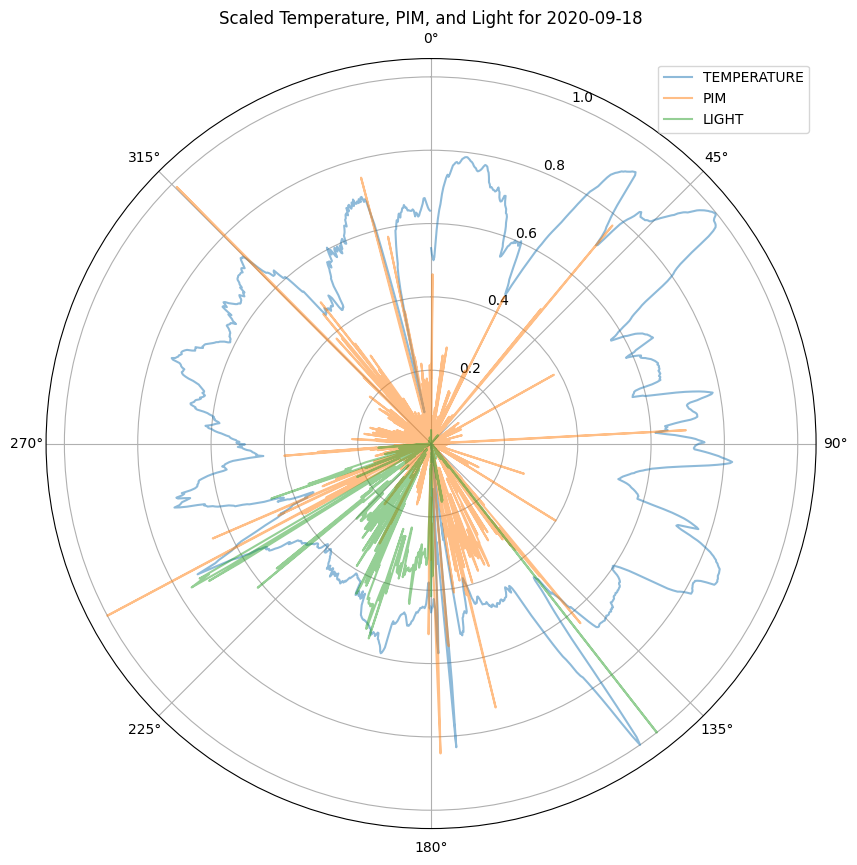

In [33]:
#line plot

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_day_polar(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Remove outliers
    day_data = remove_outliers(day_data, 'TEMPERATURE')
    day_data = remove_outliers(day_data, 'PIM')
    day_data = remove_outliers(day_data, 'LIGHT')

    # Convert DATE/TIME to hours and then to radians
    day_data['HOUR'] = day_data['DATE/TIME'].dt.hour + day_data['DATE/TIME'].dt.minute / 60
    day_data['RADIAN'] = (day_data['HOUR'] / 24) * 2 * np.pi

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['TEMPERATURE'].max(), day_data['TEMPERATURE'].min()
        pim_max, pim_min = day_data['PIM'].max(), day_data['PIM'].min()
        light_max, light_min = day_data['LIGHT'].max(), day_data['LIGHT'].min()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_min) / (temp_max - temp_min)
        day_data['PIM'] = (day_data['PIM'] - pim_min) / (pim_max - pim_min)
        day_data['LIGHT'] = (day_data['LIGHT'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['TEMPERATURE'].mean(), day_data['TEMPERATURE'].std()
        pim_mean, pim_std = day_data['PIM'].mean(), day_data['PIM'].std()
        light_mean, light_std = day_data['LIGHT'].mean(), day_data['LIGHT'].std()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_mean) / temp_std
        day_data['PIM'] = (day_data['PIM'] - pim_mean) / pim_std
        day_data['LIGHT'] = (day_data['LIGHT'] - light_mean) / light_std

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 10))

    ax.plot(day_data['RADIAN'], day_data['TEMPERATURE'], label='TEMPERATURE', color='tab:blue', alpha=0.5)
    ax.plot(day_data['RADIAN'], day_data['PIM'], label='PIM', color='tab:orange', alpha=0.5)
    ax.plot(day_data['RADIAN'], day_data['LIGHT'], label='LIGHT', color='tab:green', alpha=0.5)

    ax.set_theta_direction(-1)  # Clockwise
    ax.set_theta_offset(np.pi / 2)  # Start at the top

    ax.set_title(f'Scaled Temperature, PIM, and Light for {day}')
    ax.legend()

    plt.show()

# Example usage
plot_day_polar(df, '2020-09-18')


## With outlayers

/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/2251504903.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['HOUR'] = day_data['DATE/TIME'].dt.hour + day_data['DATE/TIME'].dt.minute / 60
/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/2251504903.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  day_data['RADIAN'] = (day_data['HOUR'] / 24) * 2 * np.pi
/var/folders/j5/c5vt47v9695609y1ssl7zjdr0000gn/T/ipykernel_10195/2251504903.py:36: SettingWithCopyWarning: 
A

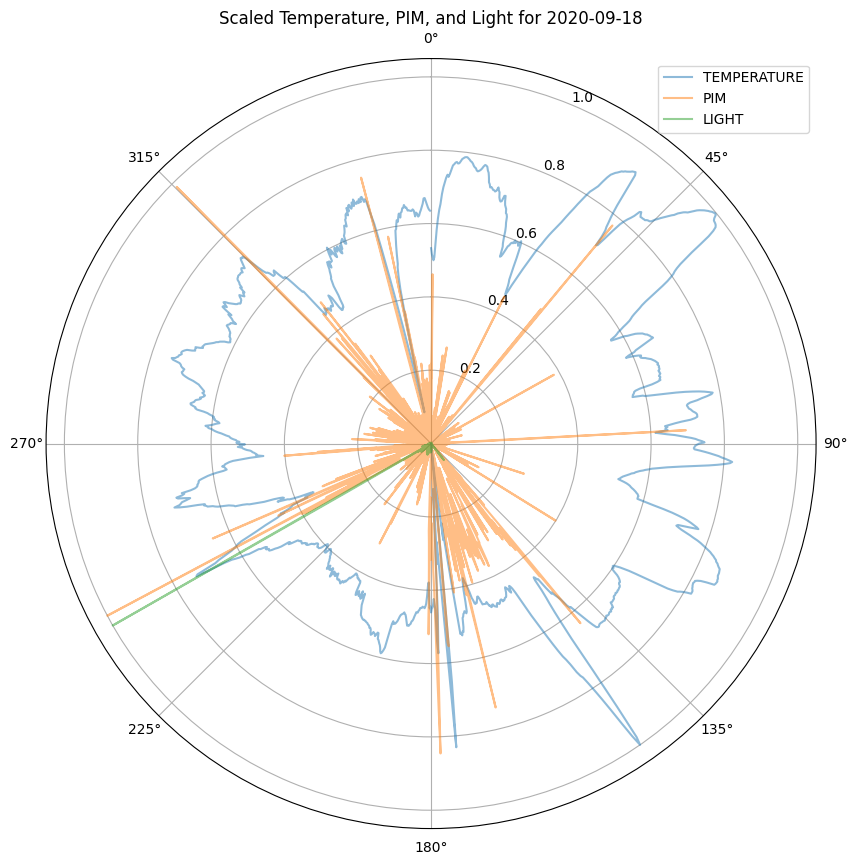

In [24]:
#line plot

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.01)
    Q3 = df[column].quantile(0.99)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def plot_day_polar(df, day, scale='normalize'):
    # Filter data for the specified day
    day_start = pd.Timestamp(day)
    day_end = day_start + pd.Timedelta(days=1)
    day_data = df[(df['DATE/TIME'] >= day_start) & (df['DATE/TIME'] < day_end)]

    # Remove outliers
    #day_data = remove_outliers(day_data, 'TEMPERATURE')
    #day_data = remove_outliers(day_data, 'PIM')
    #day_data = remove_outliers(day_data, 'LIGHT')

    # Convert DATE/TIME to hours and then to radians
    day_data['HOUR'] = day_data['DATE/TIME'].dt.hour + day_data['DATE/TIME'].dt.minute / 60
    day_data['RADIAN'] = (day_data['HOUR'] / 24) * 2 * np.pi

    # Scale data
    if scale == 'normalize':
        temp_max, temp_min = day_data['TEMPERATURE'].max(), day_data['TEMPERATURE'].min()
        pim_max, pim_min = day_data['PIM'].max(), day_data['PIM'].min()
        light_max, light_min = day_data['LIGHT'].max(), day_data['LIGHT'].min()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_min) / (temp_max - temp_min)
        day_data['PIM'] = (day_data['PIM'] - pim_min) / (pim_max - pim_min)
        day_data['LIGHT'] = (day_data['LIGHT'] - light_min) / (light_max - light_min)
    elif scale == 'standardize':
        temp_mean, temp_std = day_data['TEMPERATURE'].mean(), day_data['TEMPERATURE'].std()
        pim_mean, pim_std = day_data['PIM'].mean(), day_data['PIM'].std()
        light_mean, light_std = day_data['LIGHT'].mean(), day_data['LIGHT'].std()
        
        day_data['TEMPERATURE'] = (day_data['TEMPERATURE'] - temp_mean) / temp_std
        day_data['PIM'] = (day_data['PIM'] - pim_mean) / pim_std
        day_data['LIGHT'] = (day_data['LIGHT'] - light_mean) / light_std

    fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(10, 10))

    ax.plot(day_data['RADIAN'], day_data['TEMPERATURE'], label='TEMPERATURE', color='tab:blue', alpha=0.5)
    ax.plot(day_data['RADIAN'], day_data['PIM'], label='PIM', color='tab:orange', alpha=0.5)
    ax.plot(day_data['RADIAN'], day_data['LIGHT'], label='LIGHT', color='tab:green', alpha=0.5)

    ax.set_theta_direction(-1)  # Clockwise
    ax.set_theta_offset(np.pi / 2)  # Start at the top

    ax.set_title(f'Scaled Temperature, PIM, and Light for {day}')
    ax.legend()

    plt.show()

# Example usage
plot_day_polar(df, '2020-09-18')


## scatter plot for highly similar features

## PIM

In [25]:
# A subplot of df containing PIM, PIMn, TAT, TATn, ZCM, ZCMn
df_sub_1 = df[['PIM', 'PIMn', 'TAT', 'TATn', 'ZCM', 'ZCMn', 'hour']]

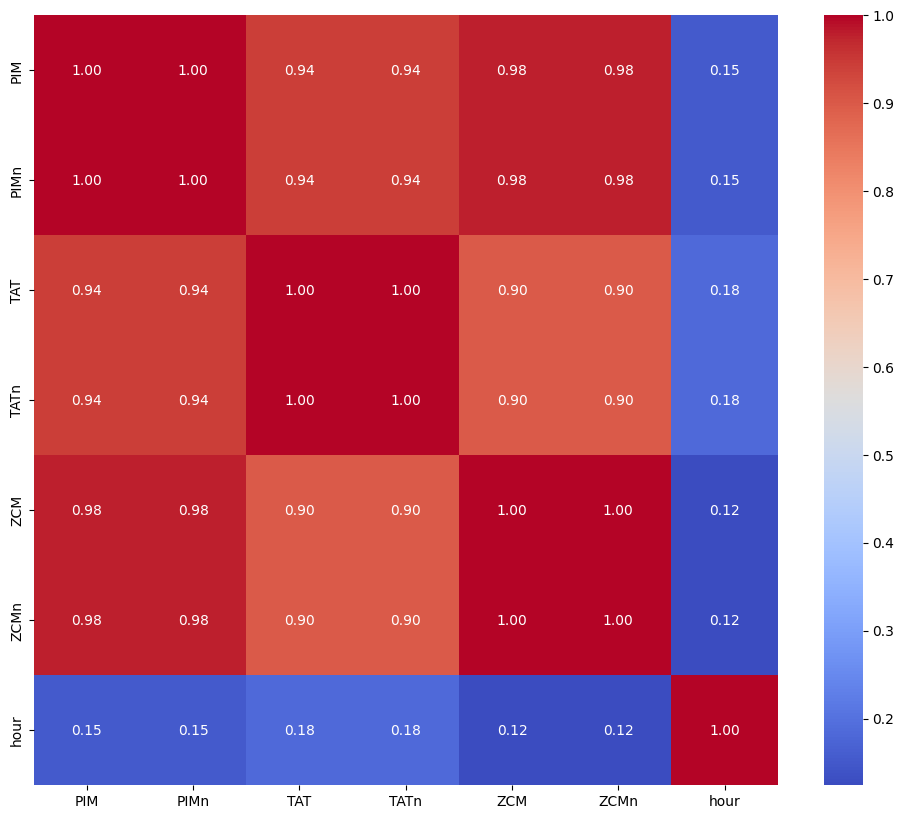

In [26]:
# calculate correlation matrix
corr_sub_1 = df_sub_1.corr()
#corr.style.background_gradient(cmap='coolwarm')

# heatmap using seaborn with correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(corr_sub_1, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

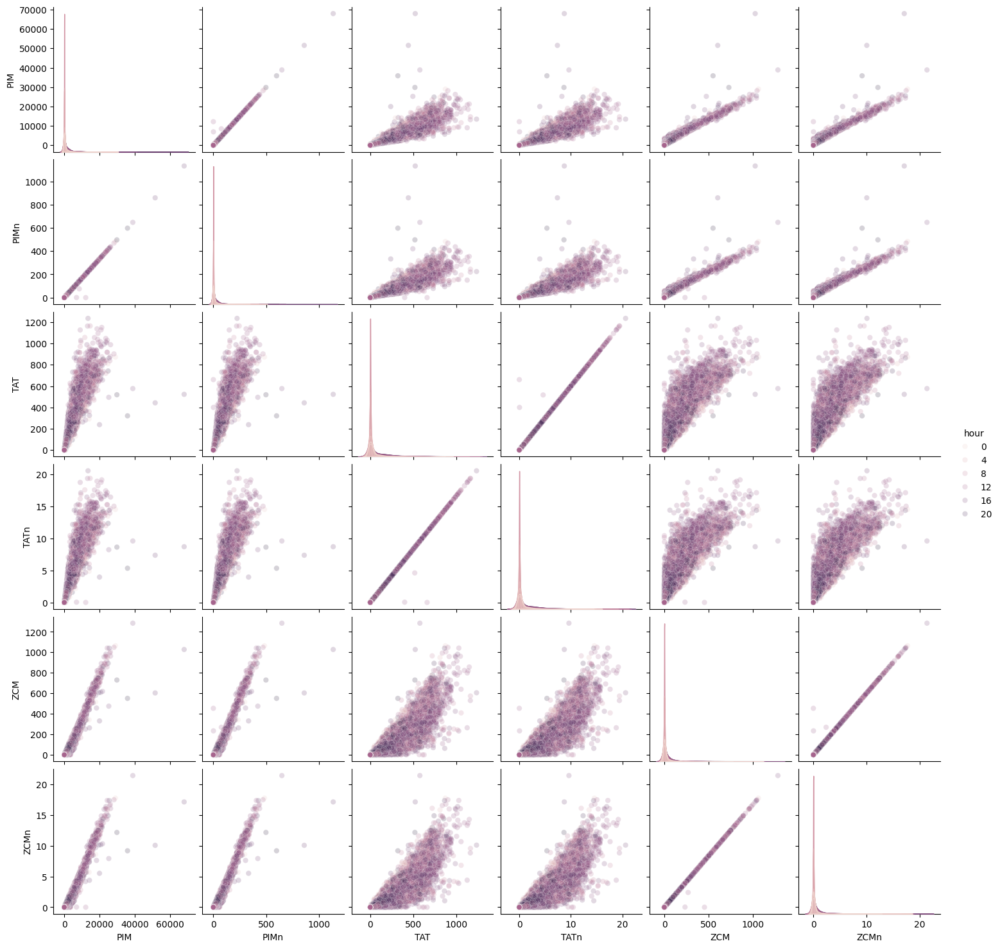

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Adjust the transparency using the alpha parameter
sns.pairplot(df_sub_1, hue='hour', plot_kws={'alpha':0.2})
plt.show()


## Light

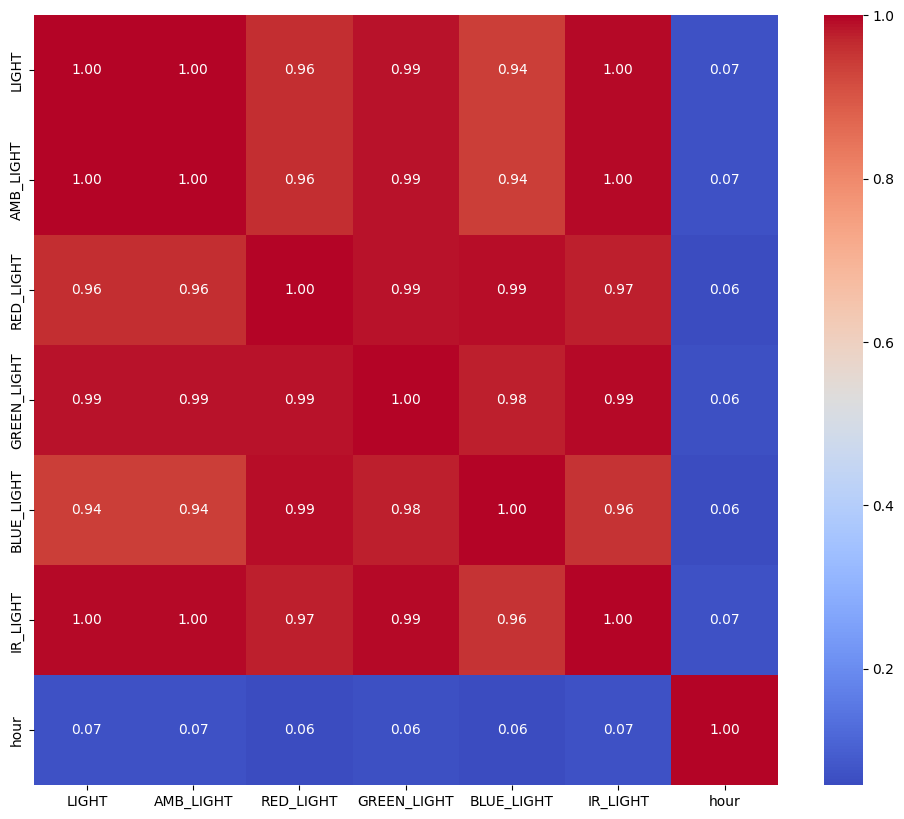

In [28]:
# A subplot of df containing ‘LIGHT’, ‘AMB_LIGHT’, ‘RED_LIGHT’, ‘GREEN_LIGHT’, ‘BLUE_LIGHT’, ‘IR_LIGHT’
df_sub_2 = df[['LIGHT', 'AMB_LIGHT', 'RED_LIGHT', 'GREEN_LIGHT', 'BLUE_LIGHT', 'IR_LIGHT', 'hour']]

#corr.style.background_gradient(cmap='coolwarm')
# calculate correlation matrix
corr_sub_2 = df_sub_2.corr()
# heatmap using seaborn with correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(corr_sub_2, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

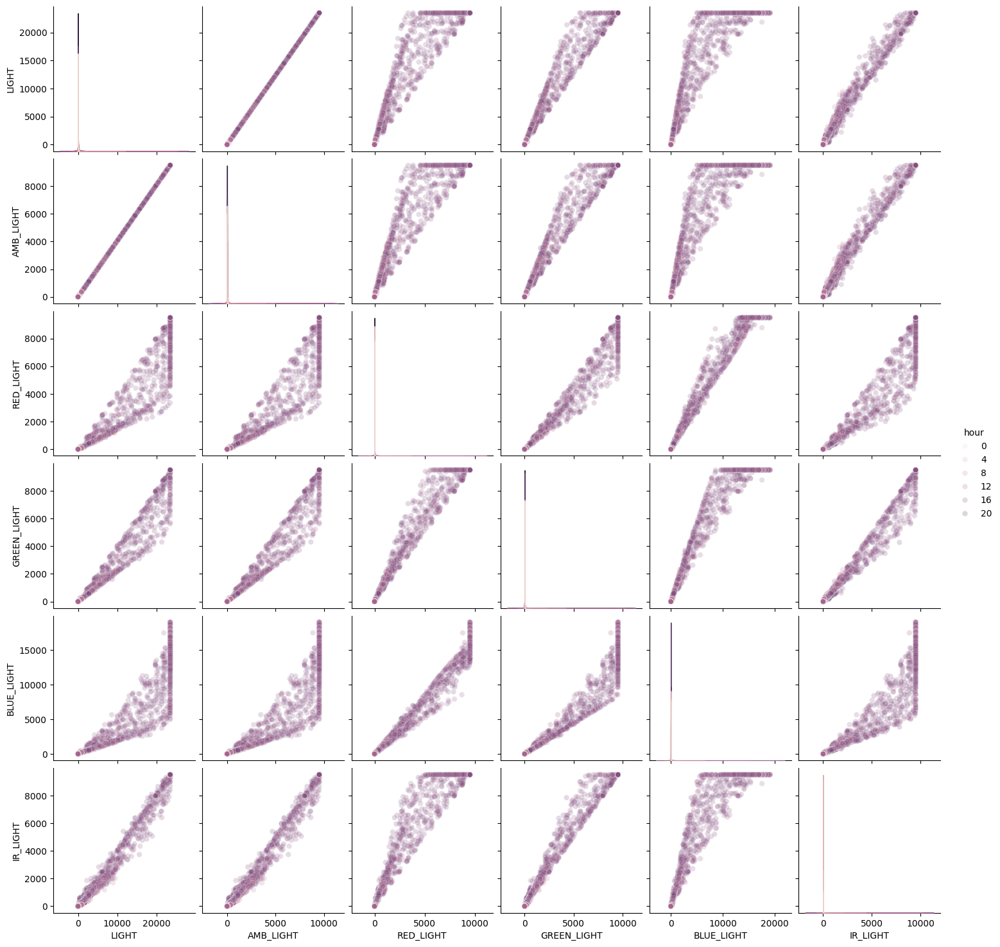

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Adjust the transparency using the alpha parameter
sns.pairplot(df_sub_2, hue='hour', plot_kws={'alpha':0.2})
plt.show()